In [8]:
import pandas as pd
import DyLoPro as dlp

In [9]:
event_log = pd.read_csv('BPIC12.csv',header=0)
case_id_key='case:concept:name'
activity_key='concept:name'
timestamp_key='time:timestamp'

In [10]:
import numpy as np
def preprocess_bpic12(log):
    """Preprocess the bpic12 event log.

    Parameters
    ----------
    log : pandas.DataFrame
        Event log.

    Returns
    -------
    log : pandas.DataFrame
        Preprocessed event log.
    """

    # Define the relevant events that determine the outcome of a case
    relevant_events = ["O_ACCEPTED", "O_DECLINED", "O_CANCELLED"]

    # Get the last relevant event for each case
    last_relevant_activities = log[log['concept:name'].isin(relevant_events)].groupby('case:concept:name').last().reset_index()
    last_relevant_activities = last_relevant_activities[['case:concept:name', 'concept:name']]
    last_relevant_activities.columns = ['case:concept:name', 'last_activity']

    # Merge this information back to the main log
    log = log.merge(last_relevant_activities, on='case:concept:name', how='left')

    # Create binary outcome columns and a categorical outcome column
    log['case:outcome'] = log['last_activity']
    outcome_labels = ['Accepted', 'Declined', 'Cancelled']
    binary_outcome_colnames = ['case accepted', 'case declined', 'case cancelled']
    for idx, event in enumerate(relevant_events):
        log[binary_outcome_colnames[idx]] = np.where(log['last_activity'] == event, 1, 0)
        log['case:outcome'] = np.where(log['last_activity'] == event, outcome_labels[idx], log['case:outcome'])

    # Drop the 'last_activity' column as it's no longer needed
    log = log.drop(['last_activity'], axis=1)

    return log
    #log['time:timestamp'] = pd.to_datetime(log['time:timestamp'], format = 'mixed').dt.tz_convert('UTC')

    #filter = (log['concept:name'] == "A_DECLINED")
    #log_declined = log[filter]["case:concept:name"].to_numpy()
    #case_outcome = [("DECLINED" if r["case:concept:name"] in log_declined else "OTHERS") for _,r in log.iterrows()]

    #log.insert(8, "case:outcome", case_outcome, True)
    #log["case declined"] = np.where(case_outcome == "DECLINED", 1, 0)
    # # Specifying which activities (if occurring) last indicate whether a case is ...
    # relevant_offer_events = ["A_DECLINED"]

    # log_offer_events = log[log['EventOrigin'] == "Offer"]

    # # Getting a dataframe that gives the last Offer activity for each case. 
    # last_Offer_Activities = log_offer_events.groupby('case:concept:name', sort=False).last().reset_index()[['case:concept:name','concept:name']]
    # last_Offer_Activities.columns = ['case:concept:name', 'last_o_act']

    # # Adding that column as a case feature to the main log by merging on case:concept:name: 
    # log = log.merge(last_Offer_Activities, on = 'case:concept:name', how = 'left')

    # # Subsetting last_Offer_Activities dataframe for only the invalid cases. 
    # last_Offer_Activities_invalid = last_Offer_Activities[~last_Offer_Activities['last_o_act'].isin(relevant_offer_events)]

    # invalid_cases_list = list(last_Offer_Activities_invalid['case:concept:name'])

    # # Dropping all invalid cases (and their events) from the main event log 
    # log = log[~log['case:concept:name'].isin(invalid_cases_list)]

    # # Adding the three 1-0 target columns 'case accepted', 'case refused', 'case canceled'

    # # and adding another categorical case feature that contains 3 levels, indicating whether 
    # # a case is 'Accepted', 'Refused' or 'Canceled':
    # log['case:outcome'] = log['last_o_act'].copy()
    # categorical_outcome_labels = ["DECLINED"]
    # binary_outcome_colnames = ['case declined']
    # for idx in range(1):
    #     offer_event = relevant_offer_events[idx]
    #     out_label = categorical_outcome_labels[idx]
    #     out_colname = binary_outcome_colnames[idx]
    #     log['case:outcome'] = np.where(log['last_o_act'] == offer_event, out_label, log['case:outcome'])
    #     log[out_colname] = np.where(log['last_o_act'] == offer_event, 1, 0)
    
    # log = log.drop(['last_o_act'], axis = 1)


In [11]:
event_log = preprocess_bpic12(event_log)

In [12]:
categorical_casefeatures = ['case:REG_DATE','case:outcome']
numerical_eventfeatures = ['org:resource']
categorical_eventfeatures = ['lifecycle:transition', 'concept:name']
numerical_casefeatures = ['case:AMOUNT_REQ']
#'notificationType','lastSent'
start_date=None
end_date=None


In [13]:
event_log['time:timestamp'] = pd.to_datetime(event_log['time:timestamp'], format = 'mixed').dt.tz_convert('UTC')

In [14]:
bpic12_plots = dlp.DynamicLogPlots(event_log, 
                                  case_id_key, 
                                  activity_key, 
                                  timestamp_key,
                                  categorical_eventfeatures= categorical_eventfeatures, 
                                  numerical_eventfeatures = numerical_eventfeatures, 
                                  numerical_casefeatures = numerical_casefeatures, 
                                  categorical_casefeatures=categorical_casefeatures,
                                  start_date =start_date, 
                                  end_date = end_date, 
                                  outcome='case accepted' )

Preprocessing the data...


100%|██████████| 262200/262200 [00:00<00:00, 1891356.93it/s]


## __1. Variants__

In [15]:
var_df = bpic12_plots.get_var_df(max_k = 10, counts = True)
print(var_df.to_string())

                                                                                                                                                                                                                                                                                                        variant  variant count
variant number                                                                                                                                                                                                                                                                                                                
1                                                                                                                                                                                                                                                                  (A_SUBMITTED, A_PARTLYSUBMITTED, A_DECLINED)           3429
2                                          

Computing additional weekly Throughput Time aggregations for each of the 10 most frequently occurring variants: 100%|██████████| 10/10 [00:00<00:00, 104.45it/s]


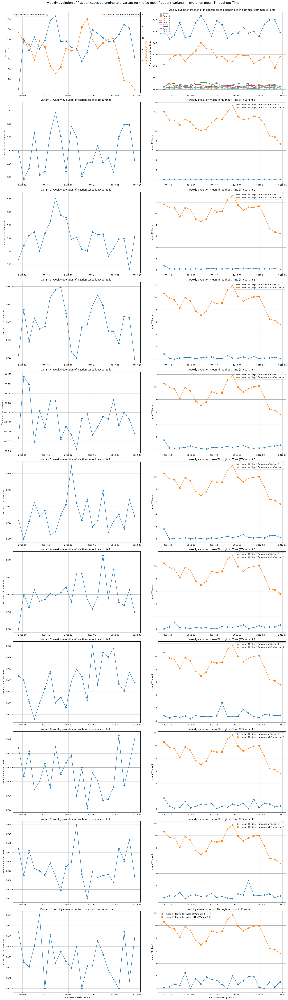

In [16]:
bpic12_plots.topK_variants_evol(plt_type = 'type_tt')

Computing additional weekly outcome aggregations for each of the 10 most frequently occurring variants: 100%|██████████| 10/10 [00:00<00:00, 45.99it/s]


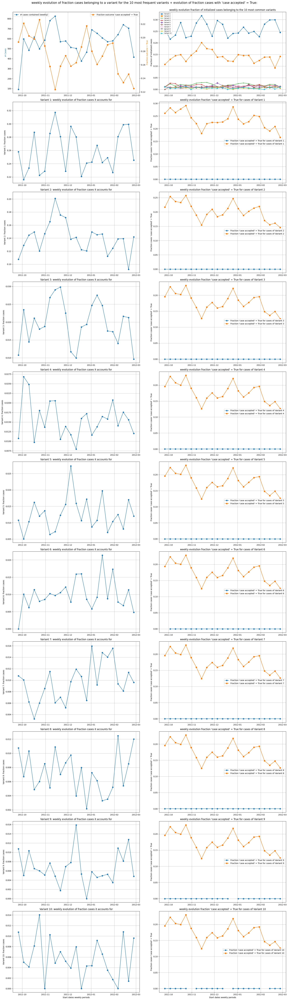

In [17]:
bpic12_plots.topK_variants_evol(plt_type = 'type_outcome')

Computing additional weekly outcome aggregations for each of the 10 most frequently occurring variants: 100%|██████████| 10/10 [00:00<00:00, 44.56it/s]


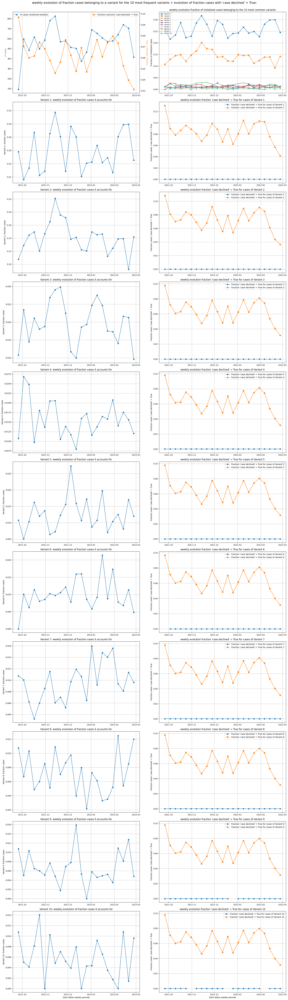

In [18]:
bpic12_plots.set_outcomeColumn(outcome = 'case declined')
bpic12_plots.topK_variants_evol(plt_type = 'type_outcome')

##### 1.2.C: Outcome - __'case cancelled'__

Computing additional weekly outcome aggregations for each of the 10 most frequently occurring variants: 100%|██████████| 10/10 [00:00<00:00, 41.44it/s]


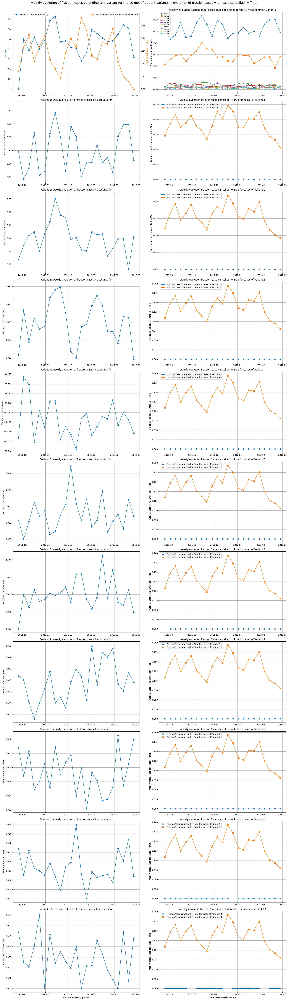

In [19]:
bpic12_plots.set_outcomeColumn(outcome = 'case cancelled')
bpic12_plots.topK_variants_evol(plt_type = 'type_outcome')

In [19]:
dfr_df = bpic12_plots.get_DFR_df(max_k = 10, counts = True)
print(dfr_df.to_string())

                                                                         DFR  DFR count
DFR number                                                                             
1                           (W_Completeren aanvraag, W_Completeren aanvraag)      38004
2                                 (W_Nabellen offertes, W_Nabellen offertes)      36084
3           (W_Nabellen incomplete dossiers, W_Nabellen incomplete dossiers)      18475
4                                           (A_SUBMITTED, A_PARTLYSUBMITTED)      13087
5                                    (A_PREACCEPTED, W_Completeren aanvraag)       7367
6                                                        (O_CREATED, O_SENT)       7030
7                                   (W_Afhandelen leads, W_Afhandelen leads)       6992
8                                              (O_SENT, W_Nabellen offertes)       6633
9                     (W_Valideren aanvraag, W_Nabellen incomplete dossiers)       5911
10                              

Computing additional weekly Throughput Time aggregations for each of the 10 most frequently occurring DFRs: 100%|██████████| 10/10 [00:00<00:00, 115.25it/s]


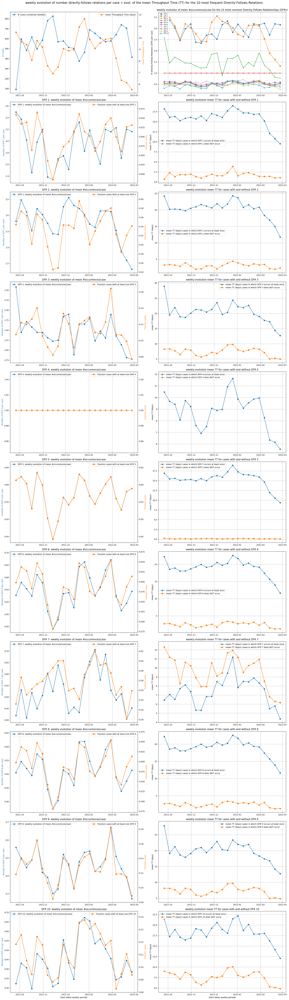

In [20]:
BPIC12_plots.topK_dfr_evol(plt_type = 'type_tt')

Computing additional weekly aggregations of the amount of events per case for each of the 10 most frequently occurring DFRs: 100%|██████████| 10/10 [00:00<00:00, 88.33it/s]


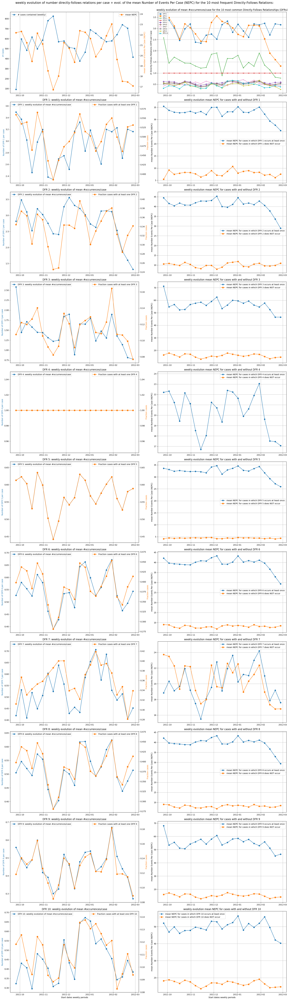

##### 1.2.C: Outcome - __'case cancelled'__

Computing additional weekly outcome aggregations for each of the 10 most frequently occurring variants: 100%|██████████| 10/10 [00:00<00:00, 44.94it/s]


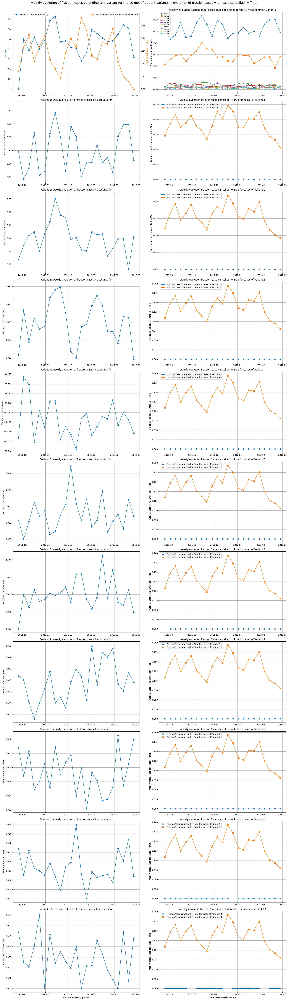

In [13]:
BPIC12_plots.set_outcomeColumn(outcome = 'case cancelled')
BPIC12_plots.topK_variants_evol(plt_type = 'type_outcome')

### __3.1 'case:AMOUNT_REQ'__ - Representation type: __Throughput Time (TT)__

### __3.3 'case:RequestedAmount'__ - Representation type: __Outcome__

Computing the additional weekly outcome aggregations for each of the 1 given numerical case features: 100%|██████████| 1/1 [00:00<00:00, 47.74it/s]


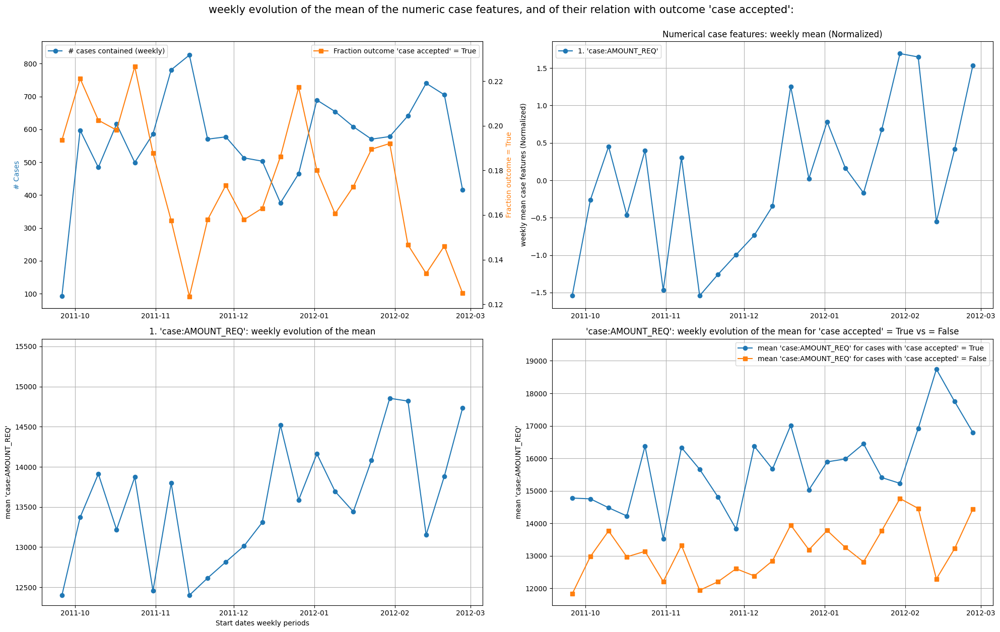

In [14]:
BPIC12_plots.set_outcomeColumn(outcome = 'case accepted')
BPIC12_plots.num_casefts_evol(numeric_case_list = numerical_casefeatures, plt_type = 'type_outcome')

#### 3.3.B: Outcome - __'case declined'__

Computing the additional weekly outcome aggregations for each of the 1 given numerical case features: 100%|██████████| 1/1 [00:00<00:00, 47.75it/s]


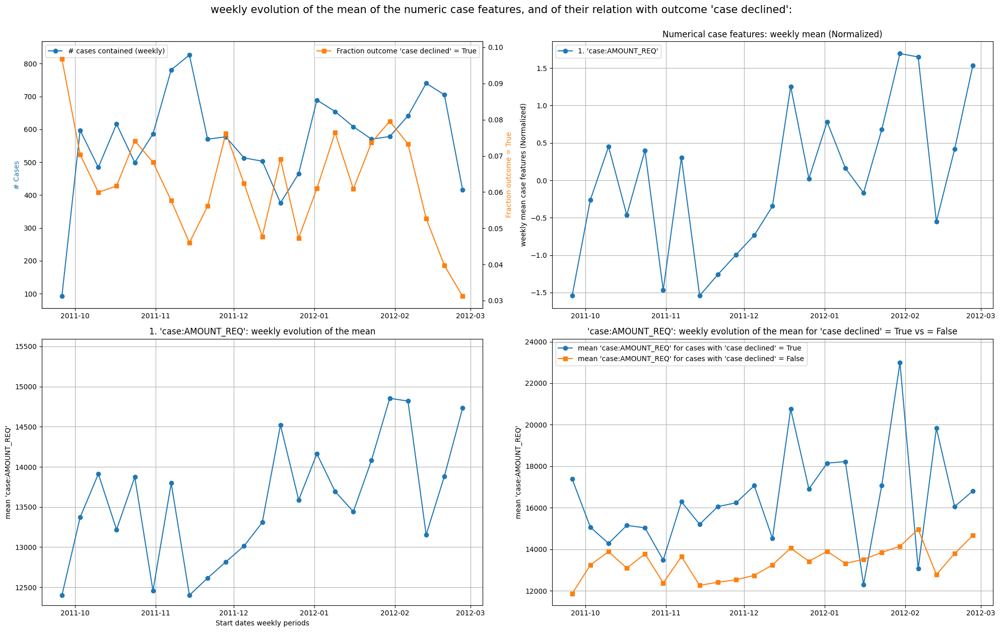

In [17]:
BPIC12_plots.set_outcomeColumn(outcome = 'case declined')
BPIC12_plots.num_casefts_evol(numeric_case_list = numerical_casefeatures, plt_type = 'type_outcome')

#### 3.3.C: Outcome - __'case cancelled'__

Computing the additional weekly outcome aggregations for each of the 1 given numerical case features: 100%|██████████| 1/1 [00:00<00:00, 47.75it/s]


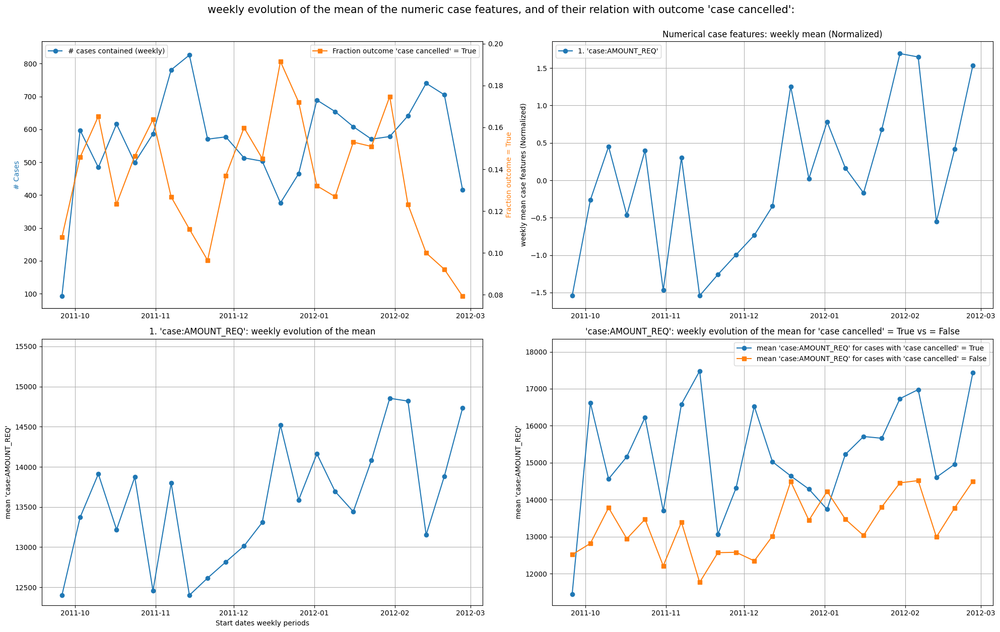

In [18]:
BPIC12_plots.set_outcomeColumn(outcome = 'case cancelled')
BPIC12_plots.num_casefts_evol(numeric_case_list = numerical_casefeatures, plt_type = 'type_outcome')

## __4. Numerical Case Feature__

Computing additional weekly Throughput Time aggregations for each of the 10 most frequently occurring variants: 100%|██████████| 10/10 [00:00<00:00, 107.78it/s]


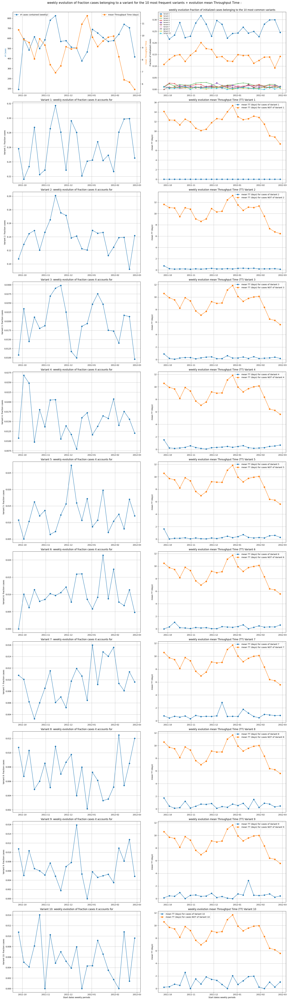

In [10]:
BPIC12_plots.topK_variants_evol(max_k = 10, plt_type = 'type_tt', xtr_outlier_rem = False)

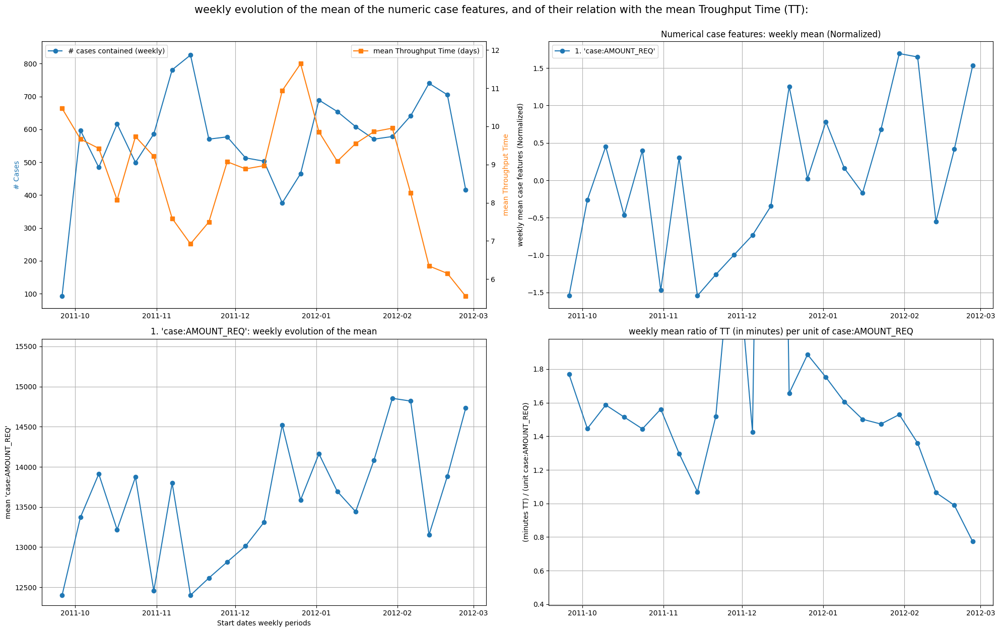

In [42]:
BPIC12_plots.num_casefts_evol(numeric_case_list = numerical_casefeatures, plt_type = 'type_tt')